In [1]:
import os
os.environ["ONNXRUNTIME_EXECUTION_PROVIDERS"] = "CPUExecutionProvider"

In [2]:
ROBOFLOW_API_KEY = '2S3uUq52q50nYnK1zfoB'

In [3]:
from inference import get_model

PLAYER_DETECTION_MODEL_ID = "football-players-detection-3zvbc/11"
PLAYER_DETECTION_MODEL = get_model(model_id=PLAYER_DETECTION_MODEL_ID, api_key=ROBOFLOW_API_KEY)

[12/12/24 23:30:32] WARNING  Your inference package version 0.29.1 is out of date! Please upgrade to ]8;id=56134;file://c:\Users\Adminlabpc18\AppData\Local\Programs\Python\Python311\Lib\site-packages\inference\core\__init__.py\__init__.py]8;;\:]8;id=920239;file://c:\Users\Adminlabpc18\AppData\Local\Programs\Python\Python311\Lib\site-packages\inference\core\__init__.py#41\41]8;;\
                             version 0.30.0 of inference for the latest features and bug fixes by                  
                             running `pip install --upgrade inference`.                                            

Exception in thread Thread-5 (_usage_sender):
Traceback (most recent call last):
  File "c:\Users\Adminlabpc18\AppData\Local\Programs\Python\Python311\Lib\threading.py", line 1045, in _bootstrap_inner
    self.run()
  File "C:\Users\Adminlabpc18\AppData\Roaming\Python\Python311\site-packages\ipykernel\ipkernel.py", line 766, in run_closure
    _threading_Thread_run(self)
  File "c:\Users\Adminlabpc18\AppData\Local\Programs\Python\Python311\Lib\threading.py", line 982, in run
    self._target(*self._args, **self._kwargs)
  File "c:\Users\Adminlabpc18\AppData\Local\Programs\Python\Python311\Lib\site-packages\inference\usage_tracking\collector.py", line 450, in _usage_sender
    self._flush_queue()
  File "c:\Users\Adminlabpc18\AppData\Local\Programs\Python\Python311\Lib\site-packages\inference\usage_tracking\collector.py", line 458, in _flush_queue
    merged_payloads: APIKeyUsage = zip_usage_payloads(
                                   ^^^^^^^^^^^^^^^^^^^
  File "c:\Users\Adminlabpc18\A

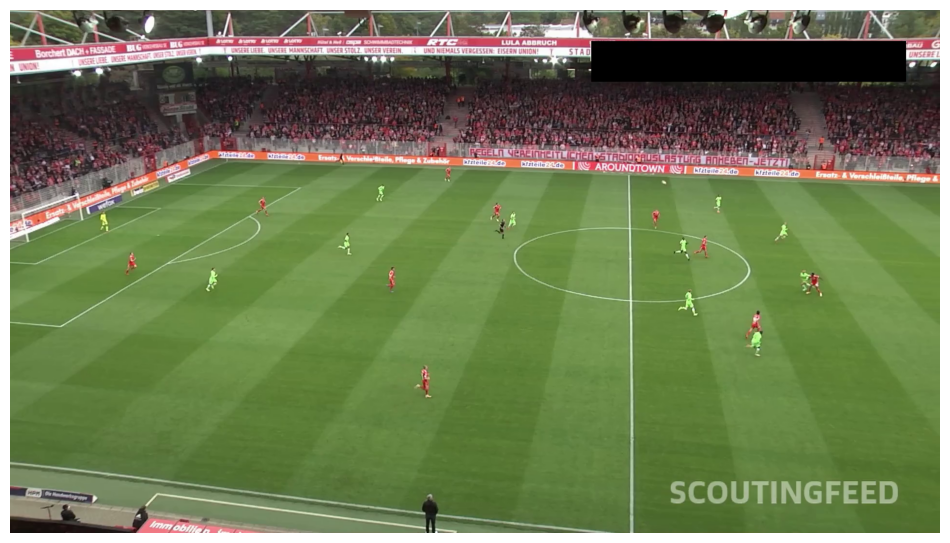

In [4]:
import supervision as sv

SOURCE_VIDEO_PATH = "121364_0.mp4"

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

sv.plot_image(frame)

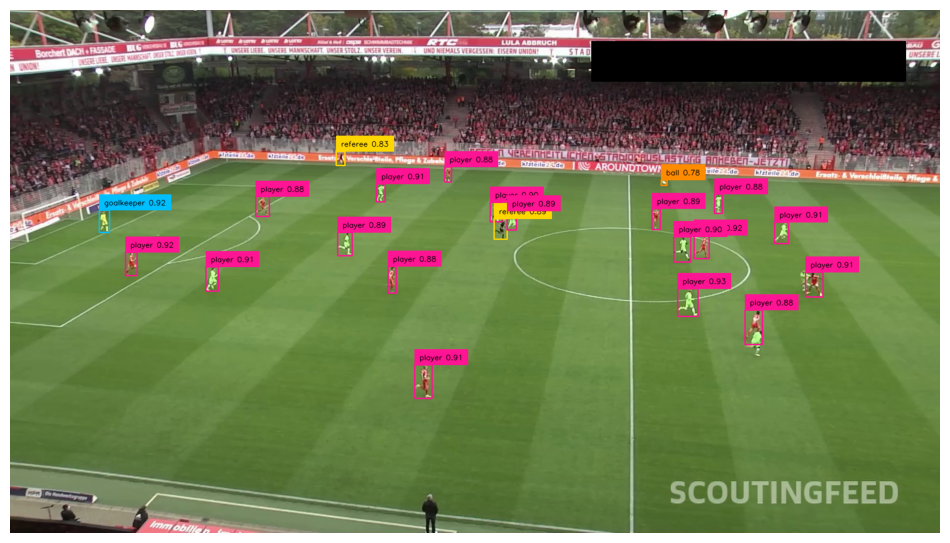

In [7]:
import supervision as sv

SOURCE_VIDEO_PATH = "121364_0.mp4"

box_annotator = sv.BoxAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000')
)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(
    scene=annotated_frame,
    detections=detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=labels)

sv.plot_image(annotated_frame)

In [10]:
from tqdm import tqdm

SOURCE_VIDEO_PATH = "121364_0.mp4"
PLAYER_ID = 2
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    detections = detections.with_nms(threshold=0.5, class_agnostic=True)
    detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

collecting crops: 25it [01:30,  3.62s/it]


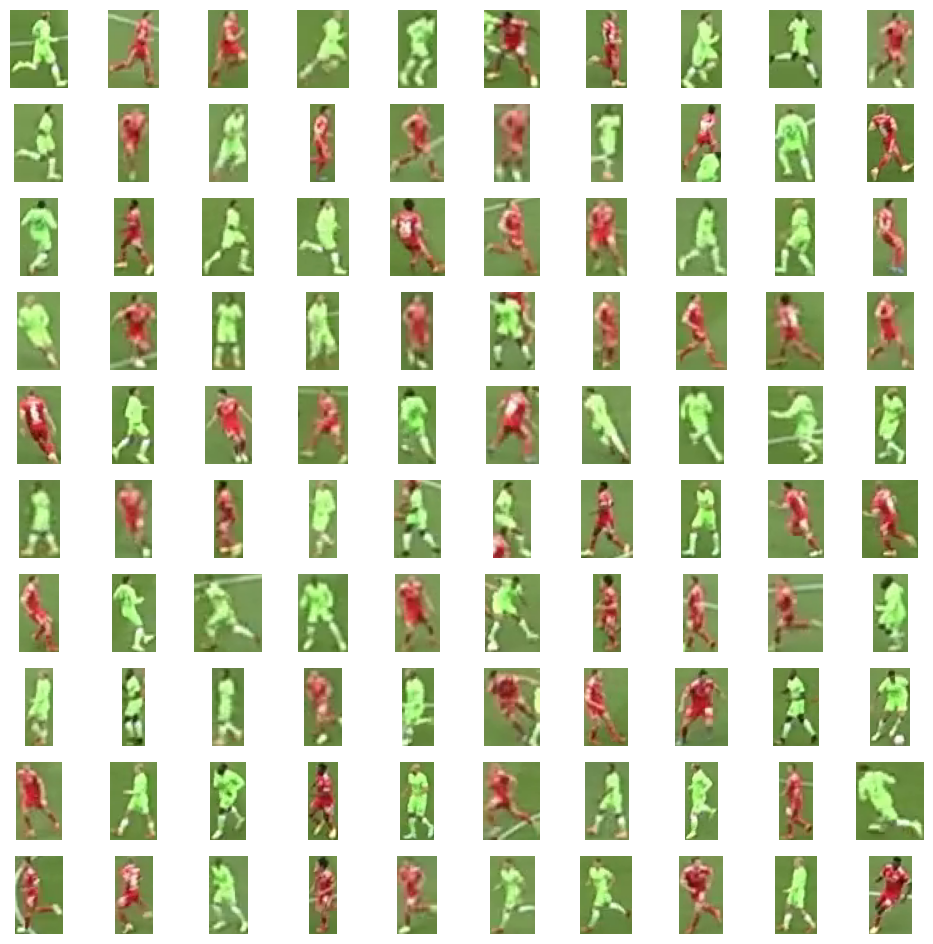

In [11]:
sv.plot_images_grid(crops[:100], grid_size=(10, 10))

In [ ]:
import supervision as sv
from tqdm import tqdm
from team_classifier import TeamClassifier

SOURCE_VIDEO_PATH = "121364_0.mp4"
PLAYER_ID = 2
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    players_detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

team_classifier = TeamClassifier(device="cpu")
team_classifier.fit(crops)

collecting crops: 0it [00:00, ?it/s]

collecting crops: 25it [01:23,  3.34s/it]
Embedding extraction: 18it [01:05,  3.63s/it]


In [136]:
import numpy as np
import supervision as sv

def resolve_goalkeepers_team_id(
    players: sv.Detections,
    goalkeepers: sv.Detections
) -> np.ndarray:
    goalkeepers_xy = goalkeepers.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    players_xy = players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    team_0_centroid = players_xy[players.class_id == 0].mean(axis=0)
    team_1_centroid = players_xy[players.class_id == 1].mean(axis=0)
    goalkeepers_team_id = []
    for goalkeeper_xy in goalkeepers_xy:
        dist_0 = np.linalg.norm(goalkeeper_xy - team_0_centroid)
        dist_1 = np.linalg.norm(goalkeeper_xy - team_1_centroid)
        goalkeepers_team_id.append(0 if dist_0 < dist_1 else 1)

    return np.array(goalkeepers_team_id)

Embedding extraction: 1it [00:02,  2.04s/it]


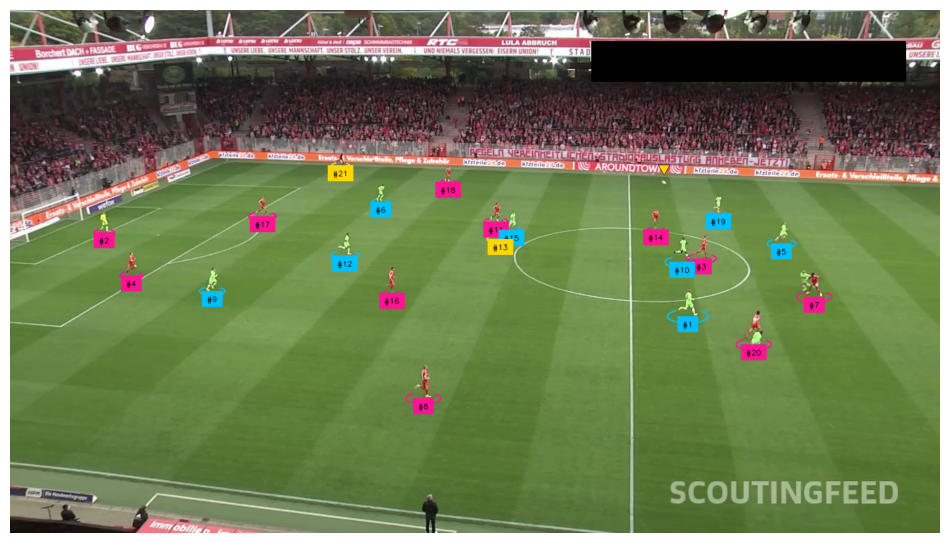

In [137]:
import supervision as sv

SOURCE_VIDEO_PATH = "121364_0.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
players_detections = all_detections[all_detections.class_id == PLAYER_ID]
referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
players_detections.class_id = team_classifier.predict(players_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    players_detections, goalkeepers_detections)

referees_detections.class_id -= 1

all_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections, referees_detections])

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

all_detections.class_id = all_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

# Key-Point Detection of the Football Field

In [97]:
from inference import get_model

FIELD_DETECTION_MODEL_ID = "football-field-detection-f07vi/14"
FIELD_DETECTION_MODEL = get_model(model_id=FIELD_DETECTION_MODEL_ID, api_key=ROBOFLOW_API_KEY)

In [76]:
from ultralytics import YOLO

# Load the trained model
model = YOLO('../best-field-model.pt')


0: 384x640 1 pitch, 437.4ms
Speed: 3.0ms preprocess, 437.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


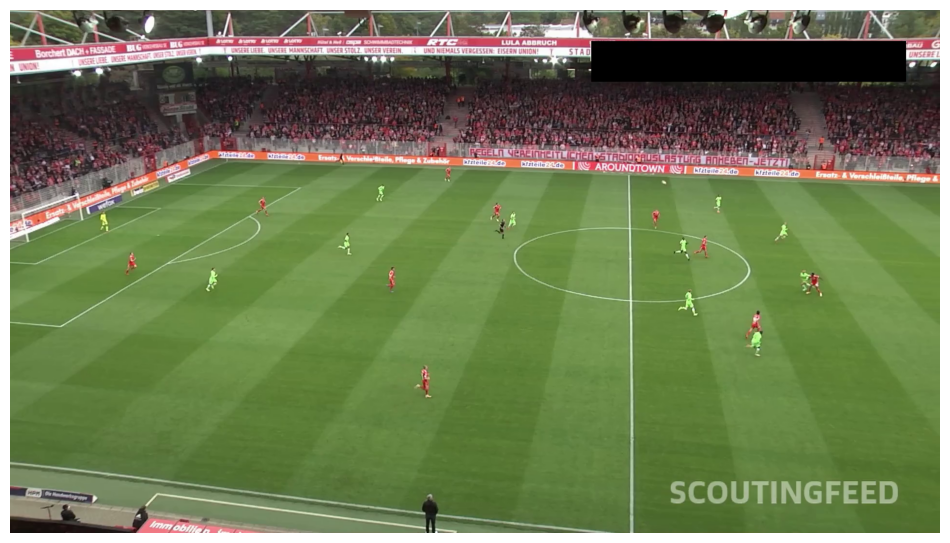

In [102]:
import supervision as sv
import numpy as np
import torch
import cv2

SOURCE_VIDEO_PATH = "121364_0.mp4"

# Initialize vertex annotator
vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8
)

# Load the video and extract a frame
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

# Run the model prediction (update the method call based on your model's API)
result = model.predict(frame, conf=0.3)

# Extract the original image from the result
orig_image = result[0].orig_img

# Display the original image
sv.plot_image(orig_image)

# Extract keypoints data
keypoints_data = result[0].keypoints.data  # Assuming result[0] has the desired keypoints
keypoints_conf = result[0].keypoints.conf

# Extract keypoints data
keypoints_data = result[0].keypoints.data  # Assuming result[0] has the desired keypoints
keypoints_conf = result[0].keypoints.conf

# Convert tensors to NumPy arrays
keypoints_data = keypoints_data.cpu().numpy() if isinstance(keypoints_data, torch.Tensor) else keypoints_data
keypoints_conf = keypoints_conf.cpu().numpy() if isinstance(keypoints_conf, torch.Tensor) else keypoints_conf

# Handle batch dimension
keypoints_data = keypoints_data[0]  # Remove batch dimension
keypoints_conf = keypoints_conf[0]  # Remove batch dimension

# Filter keypoints based on confidence
confidence_threshold = 0.5
valid_keypoints = keypoints_data[keypoints_data[:, 2] > confidence_threshold]  # Third column is confidence

# Prepare keypoints for annotation
valid_keypoints_xy = valid_keypoints[:, :2]  # x, y coordinates only
valid_keypoints_list = [tuple(map(int, point)) for point in valid_keypoints_xy]

# Annotate the frame using OpenCV
annotated_frame = orig_image.copy()  # Make a copy of the original image
for point in valid_keypoints_list:
    x, y = point
    cv2.circle(annotated_frame, center=(x, y), radius=8, color=(255, 20, 147), thickness=-1)  # Pink circles

# Display the annotated frame
cv2.imshow("Annotated Frame", annotated_frame)
cv2.waitKey(0)  # Wait for key press
cv2.destroyAllWindows()


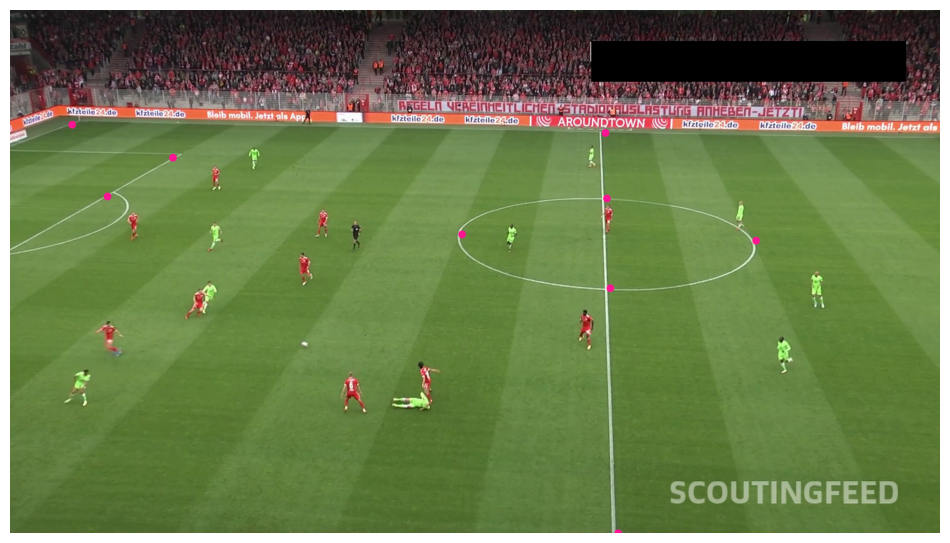

In [139]:
import supervision as sv

SOURCE_VIDEO_PATH = "121364_0.mp4"

vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)
frame = next(frame_generator)

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_reference_key_points)

sv.plot_image(annotated_frame)

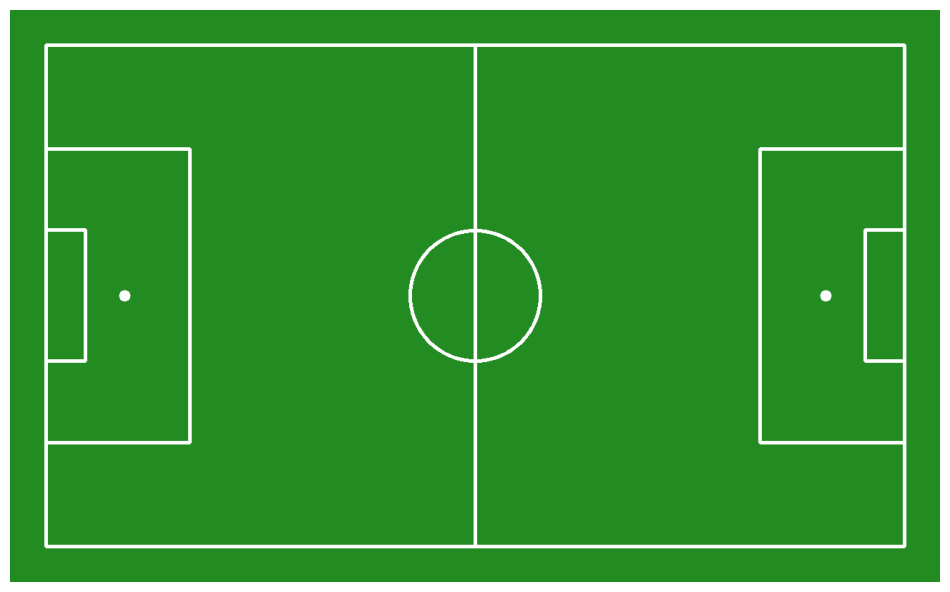

In [ ]:
from football import draw_football_pitch
from football_pitch import FootballPitchConfiguration

CONFIG = FootballPitchConfiguration()

annotated_frame = draw_football_pitch(CONFIG)

sv.plot_image(annotated_frame)

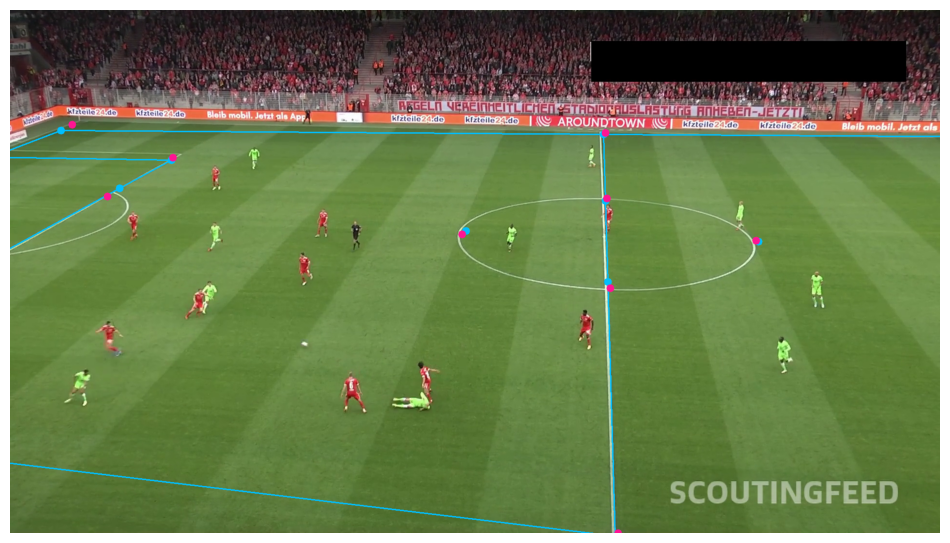

In [ ]:
import numpy as np
import supervision as sv
from pitch_projection import ViewTransformer

SOURCE_VIDEO_PATH = "121364_0.mp4"

edge_annotator = sv.EdgeAnnotator(
    color=sv.Color.from_hex('#00BFFF'),
    thickness=2, edges=CONFIG.edges)
vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)
vertex_annotator_2 = sv.VertexAnnotator(
    color=sv.Color.from_hex('#00BFFF'),
    radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)
frame = next(frame_generator)

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

pitch_reference_points = np.array(CONFIG.vertices)[filter]

transformer = ViewTransformer(
    source=pitch_reference_points,
    target=frame_reference_points
)

pitch_all_points = np.array(CONFIG.vertices)
frame_all_points = transformer.transform_points(points=pitch_all_points)

frame_all_key_points = sv.KeyPoints(xy=frame_all_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = edge_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_all_key_points)
annotated_frame = vertex_annotator_2.annotate(
    scene=annotated_frame,
    key_points=frame_all_key_points)
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_reference_key_points)

sv.plot_image(annotated_frame)

Embedding extraction: 1it [00:02,  2.55s/it]


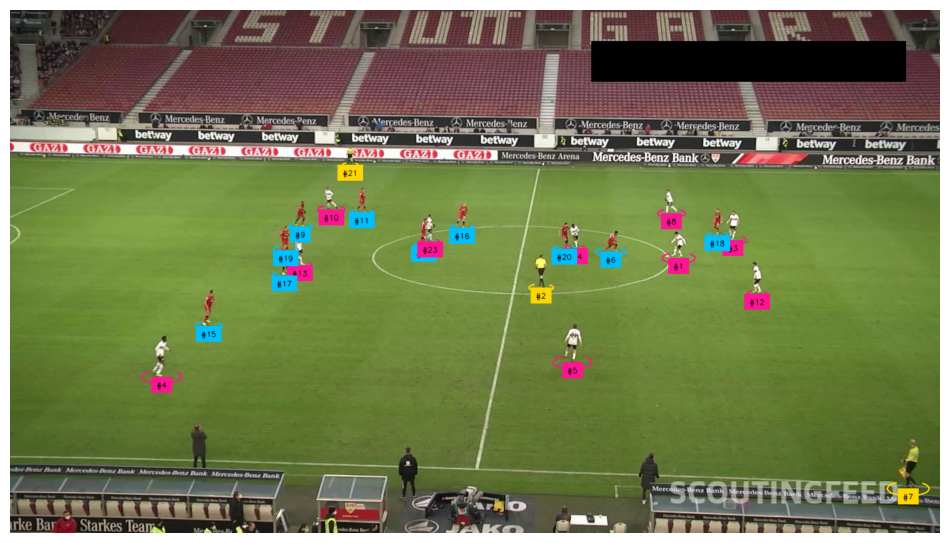

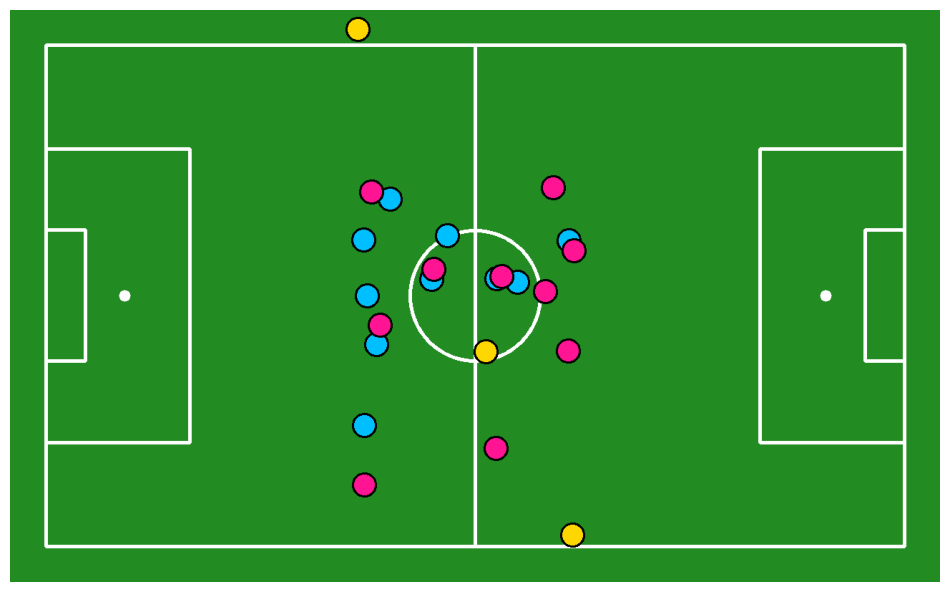

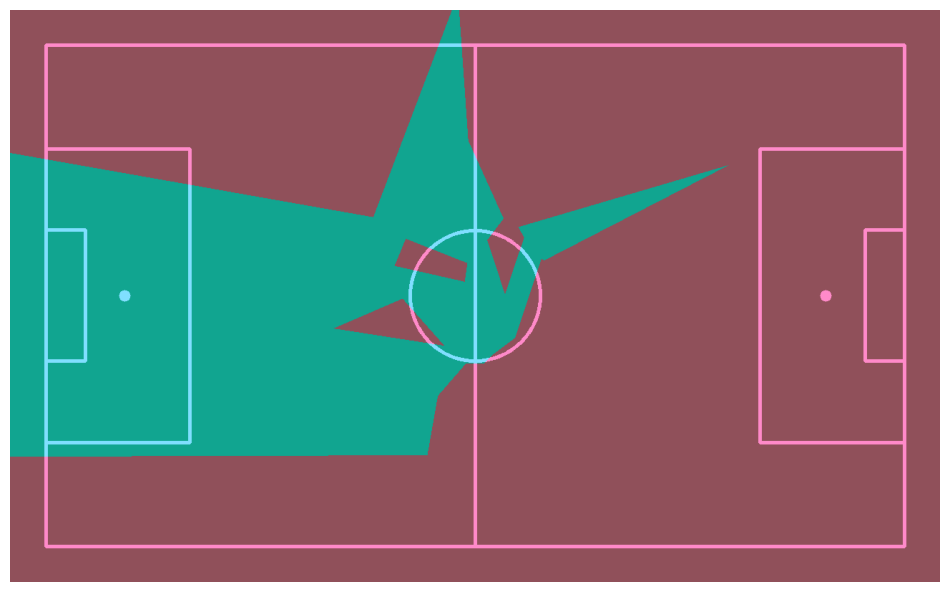

In [ ]:
import supervision as sv
from football import (
    draw_football_pitch,
    plot_points_on_pitch,
    plot_paths_on_pitch,
    draw_voronoi_regions,
)

SOURCE_VIDEO_PATH = "121364_0.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=20, height=17
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

# ball, goalkeeper, player, referee detection

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
players_detections = all_detections[all_detections.class_id == PLAYER_ID]
referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

# team assignment

players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
players_detections.class_id = team_classifier.predict(players_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    players_detections, goalkeepers_detections)

referees_detections.class_id -= 1

all_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections, referees_detections])

# frame visualization

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

all_detections.class_id = all_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

players_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections
])

# detect pitch key points

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

# project ball, players and referies on pitch

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
pitch_reference_points = np.array(CONFIG.vertices)[filter]

transformer = ViewTransformer(
    source=frame_reference_points,
    target=pitch_reference_points
)

frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_ball_xy = transformer.perspective_transform(points=frame_ball_xy)

players_xy = players_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_players_xy = transformer.perspective_transform(points=players_xy)

referees_xy = referees_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_referees_xy = transformer.perspective_transform(points=referees_xy)

# visualize video game-style radar view

annotated_frame = draw_football_pitch(CONFIG)
annotated_frame = plot_points_on_pitch(
    config=CONFIG,
    xy=pitch_ball_xy,
    face_color=sv.Color.WHITE,
    edge_color=sv.Color.BLACK,
    radius=10,
    pitch=annotated_frame)
annotated_frame = plot_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 0],
    face_color=sv.Color.from_hex('00BFFF'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame)
annotated_frame = plot_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 1],
    face_color=sv.Color.from_hex('FF1493'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame)
annotated_frame = plot_points_on_pitch(
    config=CONFIG,
    xy=pitch_referees_xy,
    face_color=sv.Color.from_hex('FFD700'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

# Assuming the team with ID 0 is the defending team
defending_team_xy = pitch_players_xy[players_detections.class_id == 1]

# Find the last defender (farthest back along the y-axis for horizontal pitch)
last_defender_x = defending_team_xy[1,:].min()  # Adjust if pitch is vertica
offside_line_path = np.array([
        [last_defender_x, 0],  # Start of the line (left edge of the pitch)
        [last_defender_x, 7000]  # End of the line (right edge of the pitch)
    ])

# Draw the offside line
annotated_frame = plot_paths_on_pitch(
    config=CONFIG,
    paths=[offside_line_path],
    color=sv.Color.RED,
    thickness=2,
    padding=50,
    scale=0.1,
    pitch=annotated_frame
)

sv.plot_image(annotated_frame)

# visualize voronoi diagram

annotated_frame = draw_football_pitch(CONFIG)
annotated_frame = draw_voronoi_regions(
    config=CONFIG,
    team_1_xy=pitch_players_xy[players_detections.class_id == 0],
    team_2_xy=pitch_players_xy[players_detections.class_id == 1],
    team_1_color=sv.Color.from_hex('00BFFF'),
    team_2_color=sv.Color.from_hex('FF1493'),
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

In [ ]:
def get_closest_player(ball_pos, players_detections, distance_threshold=30):
    
    # Get player bounding box center coordinates
    player_centers = players_detections.get_anchors_coordinates(sv.Position.CENTER)

    # Compute distances between the ball and player centers
    distances = np.linalg.norm(player_centers - ball_pos, axis=1)

    # Find the closest player within the distance threshold
    min_distance = np.min(distances)
    closest_idx = np.argmin(distances)

    if min_distance <= distance_threshold:
        return players_detections.tracker_id[closest_idx]
    else:
        # No player is close enough to the ball
        return None

def detect_pass(ball_positions, ball_detections, players_detections, frame, pass_threshold=30):
    
    if len(ball_positions) < 2:
        return None, frame  # Not enough data to detect a pass

    # Validate and reshape ball positions
    def reshape_position(pos):
        if pos.shape == (1, 2):  # Flatten (1, 2) to (2,)
            return pos[0]
        elif pos.shape == (2,):  # Already correct shape
            return pos
        elif pos.shape == (2, 2):
            return pos[0]
        else:
            raise ValueError(f"Unexpected ball position shape: {pos.shape}")

    try:
        previous_ball_pos = reshape_position(ball_positions[-2])
        current_ball_pos = reshape_position(ball_positions[-1])
    except ValueError as e:
        print(e)
        return None, frame

    # Check ball movement distance
    ball_movement = np.linalg.norm(current_ball_pos - previous_ball_pos)
    if ball_movement < pass_threshold:
        return None, frame  # Ball movement too small

    # Identify the closest player to the current ball position
    current_player_id = get_closest_player(current_ball_pos, players_detections)

    # Store the current player associated with the ball
    global previous_player_id
    if "previous_player_id" not in globals():
        previous_player_id = current_player_id

    # Detect if the closest player has changed
    if current_player_id != previous_player_id:
        start_player_id = previous_player_id
        end_player_id = current_player_id

        # Update the previous player to the current one
        previous_player_id = current_player_id

        # Convert positions to integer tuples
        try:
            start_point = tuple(map(int, previous_ball_pos))
            end_point = tuple(map(int, current_ball_pos))
        except ValueError as e:
            print(f"Error converting positions to integers: {e}")
            return None, frame

        # Draw a line representing the pass
        try:
            frame = cv2.line(frame, start_point, end_point, (0, 255, 0), 2)
            frame = cv2.putText(frame, f"Pass: {start_player_id} -> {end_player_id}",
                                (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
        except Exception as e:
            print(f"Error drawing line or text: {e}")
            return None, frame

        return (start_player_id, end_player_id), frame

    return None, frame


In [ ]:
def visualize_pass_detection(video_path, player_model, ball_id, pass_threshold=30):
    
    ball_positions = []  # To track ball positions across frames
    tracker = sv.ByteTrack()
    tracker.reset()

    # Initialize frame generator
    frame_generator = sv.get_video_frames_generator(video_path)

    # Loop through each frame
    for frame_idx, frame in enumerate(frame_generator):
        # Player and ball detections
        result = player_model.infer(frame, confidence=0.3)[0]
        detections = sv.Detections.from_inference(result)

        # Ball detection
        ball_detections = detections[detections.class_id == ball_id]
        ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

        # Player detection
        players_detections = detections[detections.class_id != ball_id]
        players_detections = tracker.update_with_detections(detections=players_detections)

        # Update ball positions
        frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
        if frame_ball_xy.size > 0:
            ball_positions.append(frame_ball_xy)

        # Call detect_pass for pass detection
        if len(ball_positions) > 1:
            pass_info, frame = detect_pass(
                ball_positions=ball_positions,
                ball_detections=ball_detections,
                players_detections=players_detections,
                frame=frame,
                pass_threshold=pass_threshold
            )

            # Print pass details if detected
            if pass_info:
                print(f"Pass detected in frame {frame_idx}: {pass_info}")
                ball_positions = []
                sv.plot_image(frame)
        # Visualize current frame


        # Optional: Break after a few frames for testing
        # if frame_idx > 100:
        #     break

Pass detected in frame 19: (None, np.int64(18))


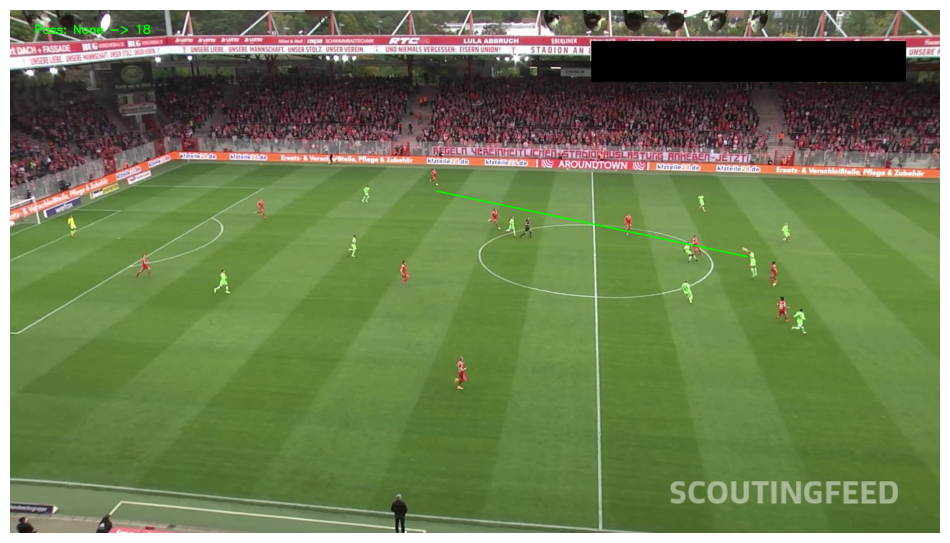

Pass detected in frame 27: (np.int64(18), None)


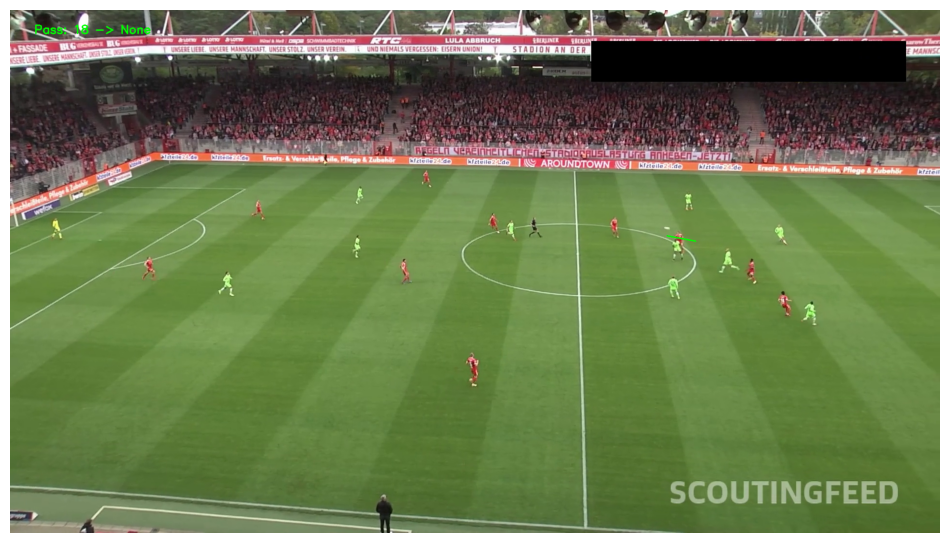

Pass detected in frame 36: (None, np.int64(14))


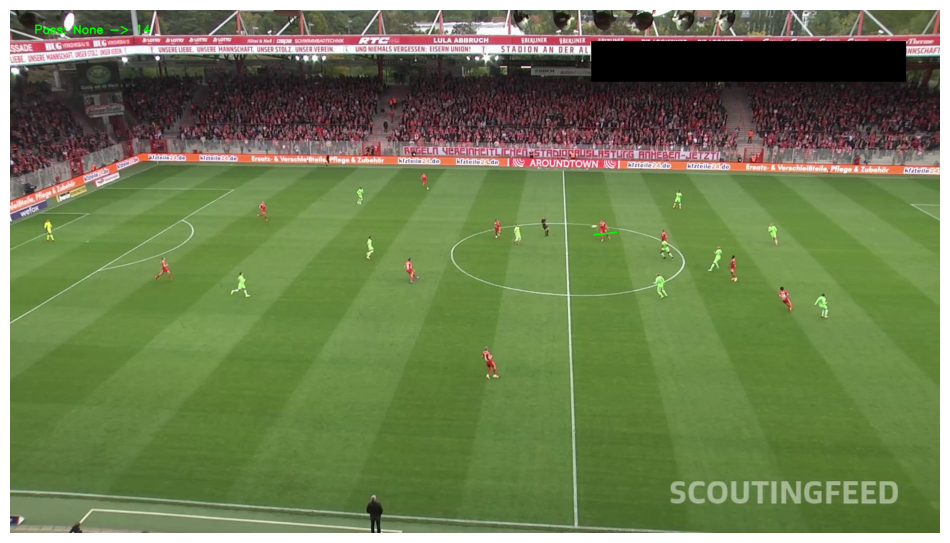

Pass detected in frame 44: (np.int64(14), None)


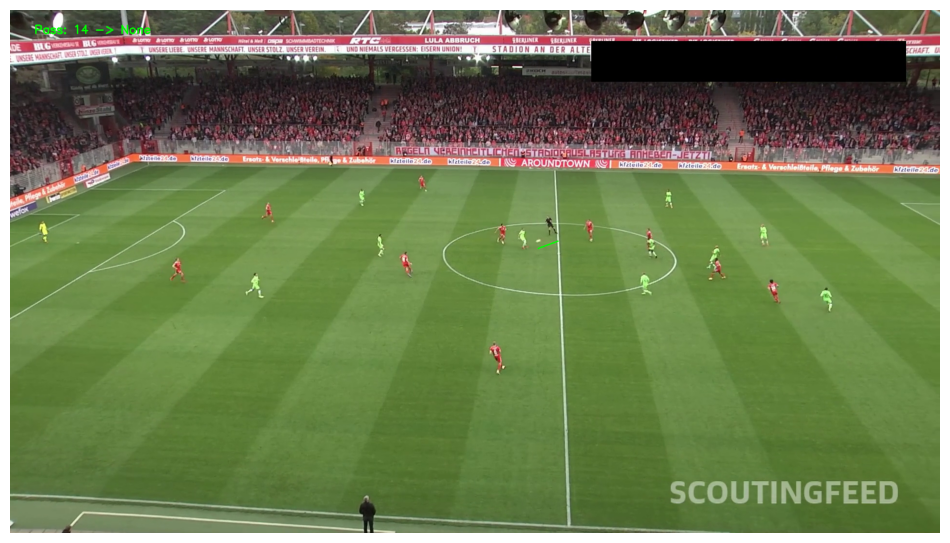

Pass detected in frame 90: (None, np.int64(18))


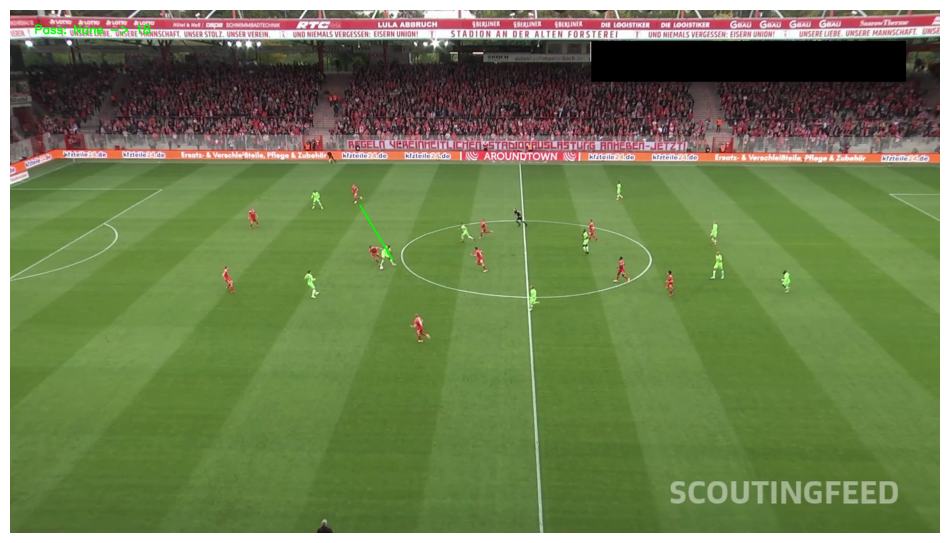

Pass detected in frame 187: (np.int64(18), None)


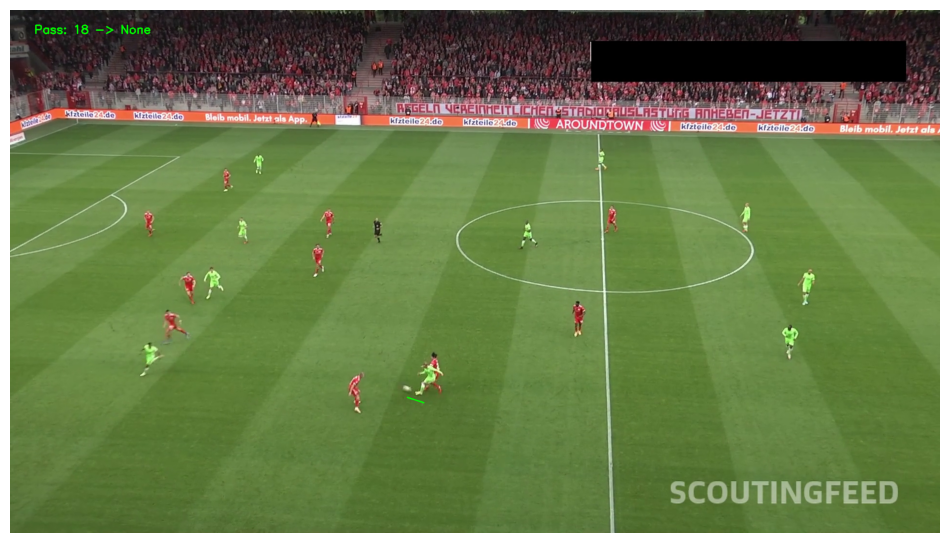

Pass detected in frame 221: (None, np.int64(36))


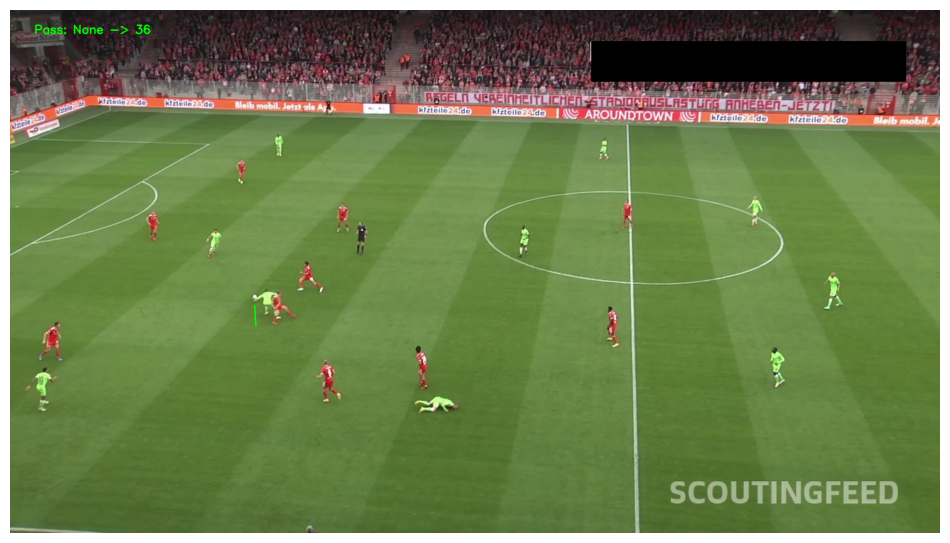

KeyboardInterrupt: 

In [105]:
previous_player_id = None  # Initialize the global variable at the start

visualize_pass_detection(
    video_path=SOURCE_VIDEO_PATH,
    player_model=PLAYER_DETECTION_MODEL,
    ball_id=0,
    pass_threshold=30
)


In [ ]:
import cv2

def detect_and_visualize_pass(
    pitch_ball_positions, pitch_players_positions, players_detections, annotated_frame
):
    
    global previous_player_id, previous_ball_pos

    if len(pitch_ball_positions) < 2:
        return annotated_frame  # Not enough data to detect a pass

    current_ball_pos = pitch_ball_positions[-1]
    previous_ball_pos = pitch_ball_positions[-2] if len(pitch_ball_positions) > 1 else None

    # Identify the closest player to the ball
    distances = np.linalg.norm(pitch_players_positions - current_ball_pos, axis=1)
    closest_player_index = np.argmin(distances)
    closest_player_id = players_detections.tracker_id[closest_player_index]

    if "previous_player_id" not in globals():
        previous_player_id = closest_player_id

    # Check if the closest player has changed
    if closest_player_id != previous_player_id:
        start_player_id = previous_player_id
        end_player_id = closest_player_id

        # Draw a line representing the pass
        start_point = tuple(map(int, pitch_players_positions[players_detections.tracker_id == start_player_id][0]))
        end_point = tuple(map(int, pitch_players_positions[players_detections.tracker_id == end_player_id][0]))

        annotated_frame = cv2.line(
            annotated_frame, start_point, end_point, (0, 255, 0), 2
        )
        annotated_frame = cv2.putText(
            annotated_frame,
            f"Pass: {start_player_id} -> {end_player_id}",
            (50, 50),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.8,
            (0, 255, 0),
            2,
        )

        # Update the previous player ID
        previous_player_id = closest_player_id

    return annotated_frame

In [ ]:
import numpy as np
import supervision as sv
from football import (
    plot_paths_on_pitch,
    draw_football_pitch,
    plot_points_on_pitch,
)
from tqdm import tqdm

# Initialize pass detection variables
current_closest_player_id = None
previous_ball_xy = None
passes = []

OUTPUT_FOLDER = "radar_frames"
SOURCE_VIDEO_PATH = "121364_0.mp4"
TARGET_VIDEO_PATH = "/content/output_video.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2
REFEREE_ID = 3

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=20, height=17
)

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

# Initialize tracker outside the loop
tracker = sv.ByteTrack()

for frame_index, frame in enumerate(tqdm(frame_generator, total=video_info.total_frames)):
    # ball, goalkeeper, player, referee detection
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    ball_detections = detections[detections.class_id == BALL_ID]
    ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

    all_detections = detections[detections.class_id != BALL_ID]
    all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
    all_detections = tracker.update_with_detections(detections=all_detections)

    goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
    players_detections = all_detections[all_detections.class_id == PLAYER_ID]
    referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

    # team assignment
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
    players_detections.class_id = team_classifier.predict(players_crops)

    goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
        players_detections, goalkeepers_detections)

    referees_detections.class_id -= 1

    all_detections = sv.Detections.merge([
        players_detections, goalkeepers_detections, referees_detections])

    # frame visualization
    labels = [
        f"#{tracker_id}"
        for tracker_id
        in all_detections.tracker_id
    ]

    all_detections.class_id = all_detections.class_id.astype(int)

    annotated_frame = frame.copy()
    annotated_frame = ellipse_annotator.annotate(
        scene=annotated_frame,
        detections=all_detections)
    annotated_frame = label_annotator.annotate(
        scene=annotated_frame,
        detections=all_detections,
        labels=labels)
    annotated_frame = triangle_annotator.annotate(
        scene=annotated_frame,
        detections=ball_detections)

    players_detections = sv.Detections.merge([
        players_detections, goalkeepers_detections
    ])

    # detect pitch key points
    result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    key_points = sv.KeyPoints.from_inference(result)

    # project ball, players and referees on pitch
    filter = key_points.confidence[0] > 0.5
    frame_reference_points = key_points.xy[0][filter]
    pitch_reference_points = np.array(CONFIG.vertices)[filter]

    transformer = ViewTransformer(
        source=frame_reference_points,
        target=pitch_reference_points
    )

    frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    pitch_ball_xy = transformer.perspective_transform(points=frame_ball_xy)

    players_xy = players_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    pitch_players_xy = transformer.perspective_transform(points=players_xy)

    referees_xy = referees_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    pitch_referees_xy = transformer.perspective_transform(points=referees_xy)

    found_pass = False

    # Pass detection logic
    if len(pitch_ball_xy) > 0 and len(pitch_players_xy) > 0:
        ball_position = pitch_ball_xy[0]
        distances = np.linalg.norm(pitch_players_xy - ball_position, axis=1)
        min_distance_index = np.argmin(distances)
        min_distance = distances[min_distance_index]
        threshold = 130  # Define your distance threshold
        print(min_distance)
        print(ball_position)
        
        if min_distance < threshold:
            current_closest_player_id = players_detections.tracker_id[min_distance_index]
            if closest_player_id is None:
                closest_player_id = current_closest_player_id
                previous_ball_xy = ball_position
            elif closest_player_id != current_closest_player_id:
                print(closest_player_id, current_closest_player_id, min_distance)
                # Pass detected
                passes.append({
                    'frame_id': frame_index,
                    'from_player': closest_player_id,
                    'to_player': current_closest_player_id,
                    'start_frame': frame_index,
                    'start_position': previous_ball_xy,
                    'end_position': ball_position
                })
                found_pass=True
                # Draw pass line on the pitch
                # annotated_frame = cv2.line(
                #     annotated_frame,
                #     tuple(previous_ball_xy.astype(int)),
                #     tuple(ball_position.astype(int)),
                #     color=(0, 255, 0),  # Green color for the pass line
                #     thickness=2
                # )
                # sv.plot_image(annotated_frame)
                # Update current closest player and previous ball position
                closest_player_id = current_closest_player_id
                previous_ball_xy = ball_position
            else:
                previous_ball_xy = ball_position

    # visualize video game-style radar view
    pitch_image = draw_football_pitch(CONFIG)
    pitch_image = plot_points_on_pitch(
        config=CONFIG,
        xy=pitch_ball_xy,
        face_color=sv.Color.WHITE,
        edge_color=sv.Color.BLACK,
        radius=10,
        pitch=pitch_image)
    pitch_image = plot_points_on_pitch(
        config=CONFIG,
        xy=pitch_players_xy[players_detections.class_id == 0],
        face_color=sv.Color.from_hex('00BFFF'),
        edge_color=sv.Color.BLACK,
        radius=16,
        pitch=pitch_image)
    pitch_image = plot_points_on_pitch(
        config=CONFIG,
        xy=pitch_players_xy[players_detections.class_id == 1],
        face_color=sv.Color.from_hex('FF1493'),
        edge_color=sv.Color.BLACK,
        radius=16,
        pitch=pitch_image)
    pitch_image = plot_points_on_pitch(
        config=CONFIG,
        xy=pitch_referees_xy,
        face_color=sv.Color.from_hex('FFD700'),
        edge_color=sv.Color.BLACK,
        radius=16,
        pitch=pitch_image)

    # Draw pass lines on pitch image
    # for pass_info in passes:
    #     start_pos = pass_info['start_position']
    #     end_pos = pass_info['end_position']
    #     pitch_image = cv2.line(
    #         pitch_image,
    #         tuple(start_pos.astype(int)),
    #         tuple(end_pos.astype(int)),
    #         color=(255, 0, 0),
    #         thickness=2
    #     )
    if (found_pass):
        recent_pass = passes[len(passes)-1]
        paths = [
            np.array([recent_pass['start_position'], recent_pass['end_position']])
        ]

        pitch_image = plot_paths_on_pitch(
            config=CONFIG,
            paths=paths,
            color=sv.Color.from_hex('#FF0000'),  # Red lines for passes
            thickness=2,
            pitch=pitch_image
        )

        sv.plot_image(pitch_image)

    # sv.plot_image(pitch_image)
    # sv.plot_image(annotated_frame)
    # with sv.ImageSink(target_dir_path=OUTPUT_FOLDER, overwrite=False) as sink:
    #     sink.save_image(image=pitch_image, image_name=f"radar_frame_{frame_index:04d}.jpg")

  0%|          | 0/750 [00:00<?, ?it/s]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:01,  1.98s/it]


1107.4899
[     6320.1      679.76]


  0%|          | 1/750 [00:06<1:16:54,  6.16s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:01,  1.90s/it]


1107.5112
[     6320.2      679.65]


  0%|          | 2/750 [00:12<1:15:35,  6.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:01,  1.91s/it]


916.39246
[     6392.8      863.07]


  0%|          | 3/750 [00:18<1:15:24,  6.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:02,  2.07s/it]


769.6922
[     6469.2      996.37]


  1%|          | 4/750 [00:24<1:15:37,  6.08s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:02,  2.04s/it]


628.4813
[     6541.6        1126]


  1%|          | 5/750 [00:30<1:15:46,  6.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:02,  2.05s/it]


443.23978
[     6604.5      1291.6]


  1%|          | 6/750 [00:36<1:15:37,  6.10s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:01,  1.91s/it]


301.25168
[       6672      1447.4]


  1%|          | 7/750 [00:42<1:15:02,  6.06s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:02,  2.10s/it]


188.48235
[       6727      1583.6]


  1%|          | 8/750 [00:48<1:15:44,  6.13s/it]
Embedding extraction: 0it [00:00, ?it/s]
Embedding extraction: 1it [00:02,  2.26s/it]
  1%|          | 8/750 [00:55<1:25:13,  6.89s/it]


KeyboardInterrupt: 